   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.4/135.4 kB 6.2 MB/s eta 0:00:00
Enter the text prompt/question for the agent to analyze the image:what color is the item in the image? 


Saving pexels-webdonut-19090.jpg to pexels-webdonut-19090.jpg
File uploaded: pexels-webdonut-19090.jpg


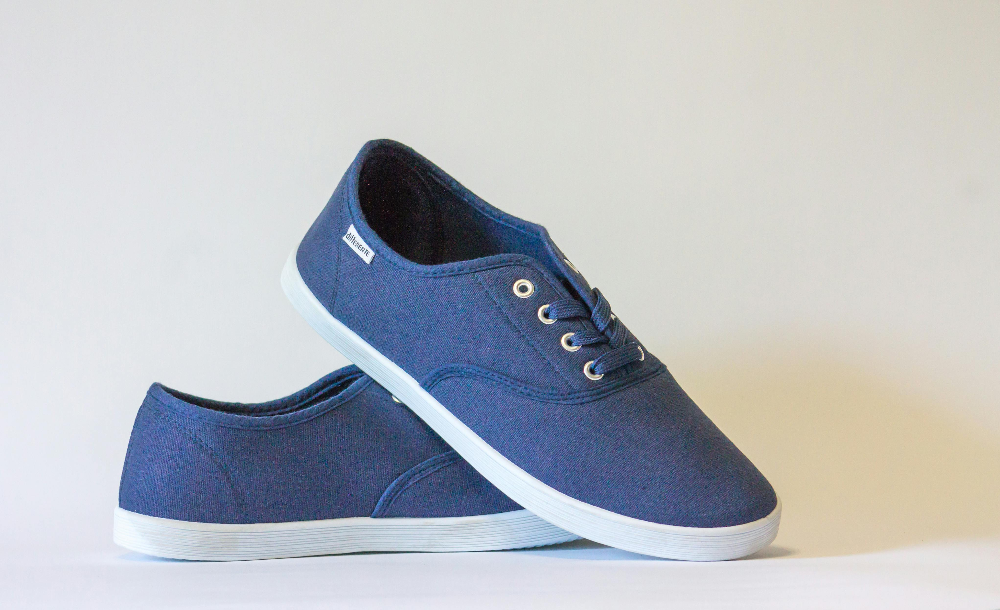


🤖 Groq Agent Response:


The item in the image appears to be blue.

In [1]:
!pip install groq pillow

import os
import io
import base64
import sys
from groq import Groq
from google.colab import files
from PIL import Image
from IPython.display import display, Markdown

from google.colab import userdata

# loading key
try:

    groq_api_key = userdata.get('GROQ_API_KEY')
    os.environ["GROQ_API_KEY"] = groq_api_key
    client = Groq()

except Exception as e:
    print("ERROR: Could not initialize Groq Client.")
    print(f"Details: {e}")
    sys.exit(1)


user_prompt = input("Enter the text prompt/question for the agent to analyze the image:")

if not user_prompt.strip():
    print("Text prompt cannot be empty. Exiting script.")
    sys.exit(1)

# upload image + process
uploaded = files.upload()

if not uploaded:
    print("No file uploaded. Exiting script.")
else:

    # getting file path for image
    image_filename = list(uploaded.keys())[0]
    image_data = uploaded[image_filename]

    # displaying it
    print(f"File uploaded: {image_filename}")
    display(Image.open(io.BytesIO(image_data)))


    base64_image = base64.b64encode(image_data).decode('utf-8')

    if base64_image:

        messages = [
            {
                "role": "user",
                "content": [
                   # including users text
                    {"type": "text", "text": user_prompt},
                    {
                        "type": "image_url",
                        "image_url": {
                            "url": f"data:image/jpeg;base64,{base64_image}",
                        },
                    },
                ],
            }
        ]


        try:
            chat_completion = client.chat.completions.create(
                messages=messages,
                model="meta-llama/llama-4-scout-17b-16e-instruct",
            )


            print("\n🤖 Groq Agent Response:")

            # markdown for cleaner output
            display(Markdown(chat_completion.choices[0].message.content))

        except Exception as e:
            print(f"\nAn error occurred during the API call: {e}")